In [7]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_excel('testword.xlsx')
print(df.to_string)
print(df.head())

<bound method DataFrame.to_string of         Unnamed: 0                                                  0
0                0  It is a little speech that I have written for ...
1                1  The Keller homestead, where the family lived, ...
2                2  The little porch was hidden from view by a scr...
3                3  A sudden gust of wind circled them and whisper...
4                4  He stooped and picked up a bird's nest that ha...
...            ...                                                ...
113201      113201  Vincent, I am more than a little peeved with A...
113202      113202  For these instructions, you will need Adobe Re...
113203      113203  Also of interest are the Rosario chapel; the r...
113204      113204  The ruins apparently are of an earlier period ...
113205      113205  These deities are not easily ' One of the most...

[113206 rows x 2 columns]>
   Unnamed: 0                                                  0
0           0  It is a little 

In [8]:
df.columns = ['unit','sentense']
print(df['sentense'])

0         It is a little speech that I have written for ...
1         The Keller homestead, where the family lived, ...
2         The little porch was hidden from view by a scr...
3         A sudden gust of wind circled them and whisper...
4         He stooped and picked up a bird's nest that ha...
                                ...                        
113201    Vincent, I am more than a little peeved with A...
113202    For these instructions, you will need Adobe Re...
113203    Also of interest are the Rosario chapel; the r...
113204    The ruins apparently are of an earlier period ...
113205    These deities are not easily ' One of the most...
Name: sentense, Length: 113206, dtype: object


In [9]:
df.columns = ['unit','sentense']
#print(df.to_string)
long = []
unit = []
count = 0
for var in df['sentense']:
    print(var)
    unit.append(count)
    long.append(len(var))
    count += 1
df['long'] = long
df['unit'] = unit
df = df.set_index("unit")

It is a little speech that I have written for him.
The Keller homestead, where the family lived, was a few steps from our little rose-bower.
The little porch was hidden from view by a screen of yellow roses and Southern smilax.
A sudden gust of wind circled them and whispered words in her mind.
He stooped and picked up a bird's nest that had fallen upon the ground.
Suddenly he stopped at the foot of a tree.
But I can see a path.
She is not a child.
We saw a baby howse!
He was dressed in black, and had a very pleasant face.
A warm hand rested on her waist.
But I am making a simple statement that life is better now than it has ever been.
She forced a smile.
It was a sobering and unpleasant question.
He arched a dark brow "Alexia?"
A touch of humor came into his eyes.
A few minutes later the nurse came in.
Analysts declared each successive generation might be "the first to have a lower standard of living than their parents."
A few seconds later Alex answered the phone.
He lifted a brow.
A

In [10]:
df.head()

,sentense,long
unit,,
0,It is a little speech that I have written for ...,50
1,"The Keller homestead, where the family lived, ...",89
2,The little porch was hidden from view by a scr...,86
3,A sudden gust of wind circled them and whisper...,67
4,He stooped and picked up a bird's nest that ha...,71


[29182, 54840, 25648, 3480]


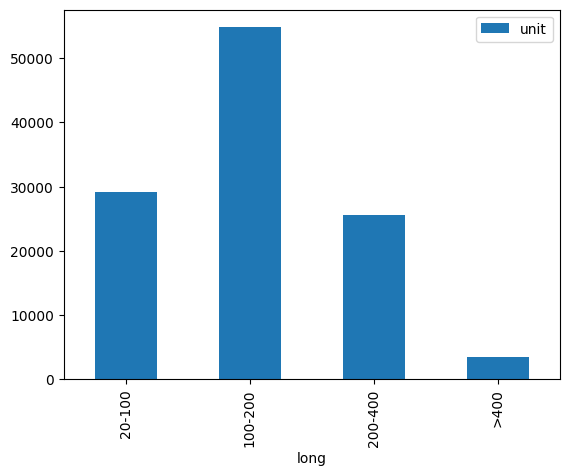

In [11]:
ls = ['20-100','100-200','200-400','>400']# short, normal, long
ls2 = list(df['long'])
#print(ls)
#print(ls2)
ls3 = [0,0,0,0]
for var in ls2:
    if 20 <= var < 100:
        ls3[0] +=1
    if 100 <= var < 200:
        ls3[1] +=1
    if 200 <= var < 400:
        ls3[2] +=1
    if 400 <= var:
        ls3[3] +=1
print(ls3)
dic = {'long': ls,
        'unit': ls3
       }
df2 = pd.DataFrame(dic,columns=['long','unit'])
df2.plot(x ='long', y='unit', kind = 'bar')
plt.show()

In [12]:

df = df.sort_values(by=['long'])
for var in df.index:
    #print(var)
    if df['long'][var] < 20 or df['long'][var] > 400:
        df = df.drop(var)
df.to_string

<bound method DataFrame.to_string of                                                 sentense  long
unit                                                          
75814                               Patton (acting), „ .    20
77292                               Can you activate it?    20
55394                               Accra is about 80 m.    20
71567                               That centre is Acre.    20
37273                               And you accept that.    20
...                                                  ...   ...
19389  The gathered illhumour of many years, aggravat...   400
75221  The English authorities instigated the Indians...   400
99929  He was returned to the House of Commons in tha...   400
72791  It seems inconceivable, however, that any othe...   400
83296  Finally, Price, writing after the demonstratio...   400

[109699 rows x 2 columns]>

In [13]:
ls2 = df['long']
mode = []
for var in ls2:
    if 20 <= var < 100:
        mode.append('short')
    elif 100 <= var < 200:
        mode.append('normal')
    else:
        mode.append('long')
#print(mode)
df['mode'] = mode
df.head()


,sentense,long,mode
unit,,,
75814,"Patton (acting), „ .",20,short
77292,Can you activate it?,20,short
55394,Accra is about 80 m.,20,short
71567,That centre is Acre.,20,short
37273,And you accept that.,20,short


In [14]:
from pandas import ExcelWriter

writer = ExcelWriter("Complete_data1.xlsx")
df.to_excel(writer, "Sheet1")
writer.save()